# Please visit the below link to view this notebook in its intended state:
https://nbviewer.org/github/maxtoll/Overwatch-League-Data/blob/main/Analysis%20-%20The%20Assault%20on%20Assault.ipynb<br>
(some formatting is ruined when uploading notebooks to Github)

## The Assault on Assault
---
Max Tollefsen<br>
February 18, 2022

The Assault game mode (also referred to as 2CP) is one of the most despised game modes in Overwatch. So much so that two Assault maps were removed from the competitive map pool. Still there are parts of the playerbase that claim this isn't enough and want to have the two maps removed from Overwatch's casual queue, quick play, as well. This disdain for 2CP is not limited to the general playerbase either, even professional players have problems with the game mode.

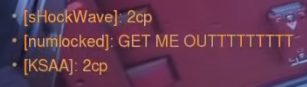

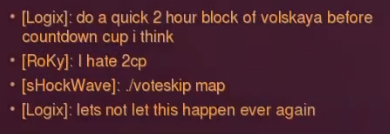
<center>Screenshots of chat as Toronto Defiant and Vancouver Titans go into round 6 on Volskaya Industries</center>

### In order, I'll be addressing the following questions:
- What are the problems with Assault?
- What is the Overwatch team doing to address them?
- What else should be done?


I'll be using data from the Overwatch League that I've cleaned and organized in SQL. The raw data can be found here: https://overwatchleague.com/en-us/statslab

In [1]:
%load_ext sql
%sql sqlite:///Overwatch_League.db

'Connected: @Overwatch_League.db'

In [2]:
%%sql

  SELECT g.game_mode,
         ROUND(AVG(r.attacker_time_banked) / 60, 2) as average_minutes_banked_first_attack
    FROM game g
    JOIN round r
      ON g.game_id = r.game_id
   WHERE r.round_number IN (1, 2)
GROUP BY g.game_mode
ORDER BY average_minutes_banked_first_attack DESC;

 * sqlite:///Overwatch_League.db
Done.


game_mode,average_minutes_banked_first_attack
Assault,1.9
Hybrid,0.99
Payload,0.78
Control,0.0


### The Attacking Team can Win Rounds Quickly

The first problem with Assault is the amount of time teams bank when they're on the attacking team. On average, during a team's first attack, they will capture both points with almost 2 minutes to spare, the highest amount of time of any game mode. This is nearly twice as much as the average time banked in Hybrid games, the second highest game mode. 

This is a symptom of how easy it is for the offensive team to steamroll the defense after gaining some momentum in Assault. Other game modes, like Payload and Hybrid, have mechanisms that curtail the attacking team's momentum and gives the defending team time to regroup. One example is that the offensive team can only advance as fast as the payload can. There are also checkpoints which temporarily stop or slow the payload and thus the attacking team's advancement. Assault has no such checkpoints, when the attacking team has captured the first point they're allowed to go straight to the second point and capture it.

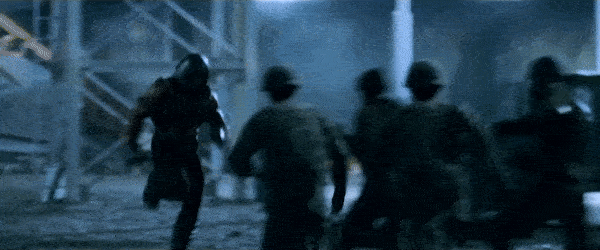
<center>Unedited footage of the attacking team right after taking the first point on Assault</center>

In [3]:
%%sql

WITH

   rounds_per_game AS (
            SELECT game_id,
                   MAX(round_number) as number_of_rounds
              FROM round
          GROUP BY game_id
                   )

  SELECT g.game_mode,
         ROUND(AVG(rpg.number_of_rounds), 2) as average_rounds_per_game
    FROM game g
    JOIN rounds_per_game rpg
      ON g.game_id = rpg.game_id
GROUP BY g.game_mode
ORDER BY average_rounds_per_game DESC;

 * sqlite:///Overwatch_League.db
Done.


game_mode,average_rounds_per_game
Assault,2.87
Hybrid,2.4
Control,2.4
Payload,2.32


### It can Take Many Rounds to Finish a Game

Assault has the most rounds on average per game because the team on offense can end rounds quickly and bank a sizeable amount of time. Thus, many rounds are needed to whittle down the time that both teams have stored which creates the feeling that the game is dragging on as you replay the same sequence of attacking and defending ([there was once a 27 round Assault game in the competitive queue](https://www.reddit.com/r/Overwatch/comments/99hlpx/i_just_played_a_27_round_game/)). Couple this with the attacking team's ability to run with momentum and you have a recipe that can lead to frustrating and repetitive games.

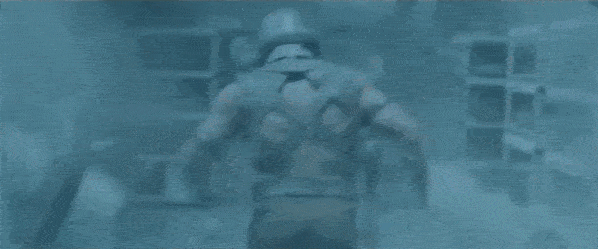
<center>Repeating 6 rounds of the same game</center>

In [4]:
%%sql

WITH

 map_count AS (
    SELECT map_name,
           game_mode,
           COUNT(*) as times_played
      FROM game
  GROUP BY map_name
           ),
draw_count AS (
    SELECT map_name,
           COUNT(*) as draws
      FROM game
     WHERE winner = "draw"
  GROUP BY map_name
           )

  SELECT mc.map_name,
         mc.game_mode,
         ROUND(((dc.draws * 100.0) / mc.times_played), 1) || " %" as percentage_of_draws_by_map,
         ROUND( SUM(dc.draws * 100.0) OVER(PARTITION BY game_mode) / 
                SUM(mc.times_played) OVER(PARTITION BY game_mode),  1) 
                || " %" as percentage_of_draws_by_game_mode
    FROM draw_count dc
    JOIN map_count mc
      ON dc.map_name = mc.map_name
ORDER BY (dc.draws * 100.0) / mc.times_played DESC;

 * sqlite:///Overwatch_League.db
Done.


map_name,game_mode,percentage_of_draws_by_map,percentage_of_draws_by_game_mode
Paris,Assault,10.8 %,6.8 %
Volskaya Industries,Assault,8.1 %,6.8 %
Horizon Lunar Colony,Assault,6.3 %,6.8 %
Temple of Anubis,Assault,5.8 %,6.8 %
Hanamura,Assault,5.7 %,6.8 %
Blizzard World,Hybrid,4.8 %,2.2 %
Numbani,Hybrid,2.4 %,2.2 %
Eichenwalde,Hybrid,2.2 %,2.2 %
King's Row,Hybrid,1.3 %,2.2 %
Hollywood,Hybrid,1.1 %,2.2 %


### There is a Good Chance There Will be no Winner

In Team Fortress 2's developer commentary mode one of the developers says, "in the world of Team Fortress a tie does not mean everyone wins, but that everyone loses." I believe this applies to most games, Overwatch included, and as such Assault is the game mode most likely to result in everyone losing.

In the Overwatch League, 6.8% of Assault games ended in a tie which is more than 1 out of every 20 games. The worst map, Paris, resulted in a tie more than 10% of the time, that's over 1 in 10 games that ended with no winner! This is an unsatisfactory outcome for all players which can be disheartening if you've invested many rounds into one game. 

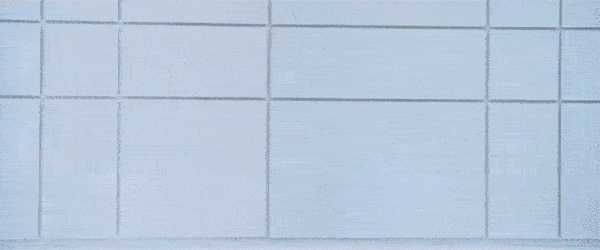
<center>Really, after all that?</center>
<br>
Worth noting is that there has yet to be a tie for either Control or Payload in the Overwatch League. In Control, it is impossible to tie and in Payload tying is extremely unlikely as you have to move the payload the exact same amount as your opponent.

### How the Overwatch Team is Addressing Assault

The Overwatch team has acknowledged the outcry against Assault and has already made changes, as well as some promises, to remedy the situation. The first measure they took was removing the Assault maps Paris and Horizon Lunar Colony from the competitive map pool. They promised to rework both maps and to date Lunar Colony has been reworked but (to some people's relief) it is still excluded from the competitive map pool.

The Overwatch team has also made clear their intention to exclude the entire Assault game mode from competitive and quick play in Overwatch 2. To fill the gap, they're going to add a new game mode, Push, where both teams fight for control of a robot that can move each team's barricade along a set path, similar to Payload. Where Push differs is that both teams have a "payload" (their barricade) that needs to be moved and there is only one robot that can move it. Whoever pushes their barricade to the enemy spawn wins. If time runs out before this, then whoever pushed their objective furthest is the winner. 

Push was specifically designed to avoid the problems of Assault we've just discussed:
- There is no chance of one side having an advantage as both teams have the same objective and the maps are mirrored.
- There are checkpoints just like in Payload that, once reached, the barricade will be unable to move further until a short amount of time has passed which quells momentum and gives the team on the back foot a chance to recover.
- There are no rounds to create repetitive gameplay, there is only the one attempt to beat the enemy team and win.
- There will almost never be draws as both teams would have to push their barricades the same distance and then avoid the objective while time runs out.

Something not shown in the data is how Assault gameplay is centered around holding chokepoints. This has been another gripe players have with Assault and Push addresses this too by having a moving objective. There are more avenues players can move through and its likelier  fights will happen in more varied parts of the map compared to Assault.

In [5]:
%%sql

WITH
           rounds_per_game AS (
                    SELECT game_id,
                           MAX(round_number) as rounds
                      FROM round
                  GROUP BY game_id
                           ),
    average_rounds_per_map AS (
                    SELECT g.map_name,
                           ROUND(AVG(rpg.rounds), 2) as average_rounds
                      FROM game g
                      JOIN rounds_per_game rpg
                        ON g.game_id = rpg.game_id
                  GROUP BY g.map_name
                           ),
   average_minutes_per_map AS (
                    SELECT g.map_name,
                           ROUND(AVG(r.attacker_time_banked) / 60, 2) as average_time
                      FROM game g
                      JOIN round r
                        ON g.game_id = r.game_id
                     WHERE r.round_number IN (1, 2)
                  GROUP BY g.map_name
                           ),
      draws_minutes_rounds AS (
                    SELECT g.map_name,
                           COUNT(*) as draws,
                           ampm.average_time,
                           arpm.average_rounds
                      FROM game g
                      JOIN average_minutes_per_map ampm
                        ON g.map_name = ampm.map_name
                      JOIN average_rounds_per_map arpm
                        ON g.map_name = arpm.map_name
                     WHERE winner = "draw"
                  GROUP BY g.map_name
                           )
            
  SELECT g.map_name,
         g.game_mode,
         dmr.average_time as average_minutes_banked_first_attack,
         dmr.average_rounds,
         ROUND( dmr.draws * 100.0 / COUNT(*), 1) || " %" as percent_of_draws
    FROM game g
    JOIN draws_minutes_rounds dmr
      ON g.map_name = dmr.map_name
   WHERE g.game_mode = "Assault"
GROUP BY g.map_name
ORDER BY average_time DESC;

 * sqlite:///Overwatch_League.db
Done.


map_name,game_mode,average_minutes_banked_first_attack,average_rounds,percent_of_draws
Paris,Assault,2.41,3.18,10.8 %
Volskaya Industries,Assault,2.15,3.14,8.1 %
Horizon Lunar Colony,Assault,2.14,2.99,6.3 %
Temple of Anubis,Assault,1.66,2.67,5.8 %
Hanamura,Assault,1.63,2.65,5.7 %


### Closing Thoughts

After looking at the data I'm happy that Overwatch is moving away from Assault in favor of other game modes like Push. My only recommendation would be that Volksaya Industries should be removed from the competitive map pool the same as Paris and Horizon Lunar Colony. In all three metrics we looked at (average minutes banked in the first attack, average number of rounds, and percentage of draws) Volskaya ranked right in between Paris and Lunar Colony. The stats of the three maps have more in common with each other than they do with the other Assault maps, Temple of Anubis and Hanamura.

In reality, I think the Overwatch team will instead choose to wait until Overwatch 2 is released because then all Assault maps will be banned anyway. And should they remove Volskaya now that would leave the game with only two Assault maps. Volskaya also has the distinction of being an original map that was released with the game, something that isn't true for Paris and Horizon Lunar Colony.

In summary, Assault allows the attacking team to carry momentum to end rounds too quickly, has too many rounds on average, and has too high a chance of ending in a draw. The Overwatch team is aware of these problems and clearly wants to improve the game as they've excluded some Assault maps from competitive play, plan to remove all Assault maps from competitive and casual queue, and designed Assault's replacement, Push, to avoid Assault's failings.

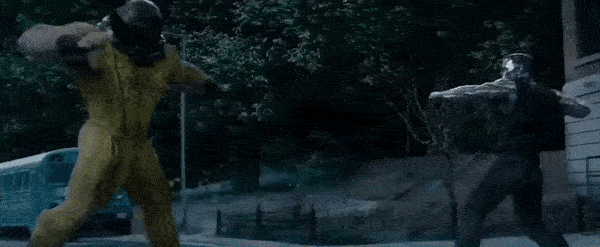
<center>I'm optimistic that Push will do better than Assault in giving players an enjoyable experience</center>